In [103]:
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [104]:
stations = pd.DataFrame([])

for pref_cd in [11, 12, 13, 14]:
    file = f'../../../data/stats/stations_{pref_cd}.csv'
    pref_stations = pd.read_csv(file)
    stations = pd.concat([stations, pref_stations])
    
stations.head(10)



,Unnamed: 0,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,...,street_segments_count,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman
0,1361,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,...,706.0,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN
1,1362,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,...,672.0,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN
2,1363,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,...,879.0,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN
3,1364,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,...,872.0,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN
4,1365,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,...,999.0,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN
5,1366,1130511,1130511,南浦和,NaN,NaN,11305,11,336-0017,さいたま市南区南浦和２丁目,...,1119.0,300.098040,272.599017,52039.970076,26763.337448,1.015478,0.000458,510.0,203.253653,NaN
6,1367,1130512,1130512,東浦和,NaN,NaN,11305,11,336-0922,さいたま市緑区大牧,...,816.0,250.371188,241.132398,47999.863277,24374.961347,1.047661,0.001238,372.0,171.841479,NaN
7,1368,1130513,1130513,東川口,NaN,NaN,11305,11,333-0811,川口市戸塚１丁目,...,753.0,204.376504,199.350852,46053.098294,23193.649554,1.021008,0.000000,421.0,176.316615,NaN
8,1369,1130514,1130514,南越谷,NaN,NaN,11305,11,343-0845,越谷市南越谷１丁目,...,756.0,207.587166,200.997097,40172.074327,20968.856572,1.020021,0.000000,328.0,135.096409,NaN
9,1370,1130525,1130525,越谷レイクタウン,NaN,NaN,11305,11,343-0825,越谷市大成町５丁目,...,372.0,105.371597,100.678935,25587.629027,15336.780550,1.060357,0.003091,192.0,81.908286,NaN


In [105]:
# 欠損している駅を除く
stations = stations[stations['station_cd'] != 1130407]

In [106]:
X_columns = ['n', 'm', 'k_avg', 'intersection_count',
       'streets_per_node_avg', 'edge_length_total', 'edge_length_avg',
       'street_length_total', 'street_length_avg', 'street_segments_count',
       'node_density_km', 'intersection_density_km', 'edge_density_km',
       'street_density_km', 'circuity_avg', 'self_loop_proportion',
       'clean_intersection_count', 'clean_intersection_density_km']


In [107]:
stations

,Unnamed: 0,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,...,street_segments_count,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman
0,1361,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,...,706.0,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN
1,1362,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,...,672.0,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN
2,1363,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,...,879.0,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN
3,1364,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,...,872.0,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN
4,1365,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,...,999.0,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,8263,9934402,9934402,公園下,NaN,NaN,99344,14,250-0500,神奈川県足柄下郡箱根町,...,184.0,72.202201,63.176926,24118.228794,12059.114397,1.122440,0.000000,108.0,57.337042,kouenshita
420,8264,9934403,9934403,公園上,NaN,NaN,99344,14,250-0500,神奈川県足柄下郡箱根町,...,164.0,64.478878,54.183931,23864.601515,11932.300758,1.170265,0.000000,93.0,50.391056,kouenue
421,8265,9934404,9934404,中強羅,NaN,NaN,99344,14,250-0500,神奈川県足柄下郡箱根町,...,144.0,59.531582,49.893135,21500.431805,10750.215902,1.169691,0.000000,82.0,46.491331,nakakyoura
422,8266,9934405,9934405,上強羅,NaN,NaN,99344,14,250-0500,神奈川県足柄下郡箱根町,...,134.0,58.432131,49.488437,21673.146309,10836.573154,1.182520,0.007463,79.0,47.103452,uekyoura


In [111]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# データ分割
X = stations[X_columns]
X_train = X

#標準化
sc = StandardScaler()
sc.fit(X)
X_std = sc.transform(X)

#主成分分析
pca = PCA(n_components=3)
pca.fit(X_std[40:45])
X_pca = pca.transform(X_std)

print('主成分分析前のデータ次元：{}'.format(X.shape))
print('主成分分析後のデータ次元：{}'.format(X_pca.shape))

#グラフ化
merge_data = pd.concat([pd.DataFrame(X_pca[:,0]), pd.DataFrame(X_pca[:,1])], axis=1)
merge_data.columns = ['pc1','pc2']

主成分分析前のデータ次元：(2031, 18)
主成分分析後のデータ次元：(2031, 3)


In [113]:
merge_data.to_csv('../../../data/kanto_stations_pca.csv')

In [114]:
# 寄与率
print(pca.explained_variance_ratio_)

[0.78819898 0.13236845 0.06681308]


In [115]:
# 基底ベクトルの値
pca.components_

array([[ 0.32492426,  0.36815647,  0.01012626,  0.26918656, -0.35298505,
         0.3355044 , -0.12190757,  0.21349904, -0.12849896,  0.27737386,
         0.29845242,  0.23473454,  0.2874772 ,  0.14793145, -0.01484514,
        -0.07384962,  0.16913555,  0.11084188],
       [-0.05789986,  0.08999151,  0.80691052, -0.01619072,  0.07080935,
         0.23411427,  0.04163904, -0.0251506 ,  0.01875485, -0.05002204,
        -0.13479213, -0.09305572,  0.13072717, -0.16538253,  0.03735236,
         0.41074191,  0.16158699,  0.06822692],
       [ 0.0405565 , -0.0028682 , -0.15976948,  0.10982103, -0.61852943,
        -0.13064772, -0.13071266, -0.23358011, -0.14974614, -0.05295161,
        -0.05064367,  0.01896714, -0.32810968, -0.44200956,  0.06159221,
         0.37808267,  0.10299257, -0.03063908]])

In [116]:
# k-means法を使うためのインポート
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# データの列の絞り込み
pc = merge_data[['pc1','pc2']]

# 標準化
sc = StandardScaler()
sc.fit(pc)
pc_std = sc.transform(pc)

0    868
1    381
2    782
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

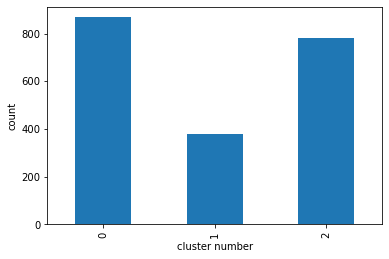

In [117]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=3, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [118]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,Unnamed: 0,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1361,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,0
1,1362,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,0
2,1363,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,0
3,1364,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,2
4,1365,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,0


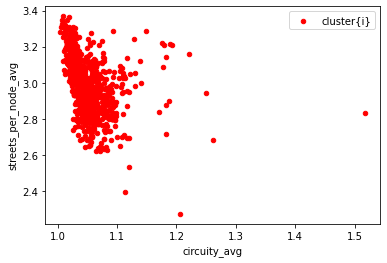

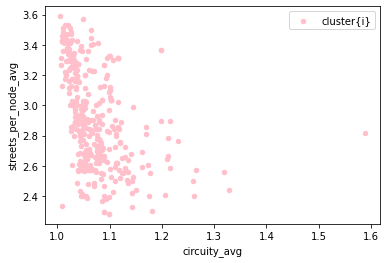

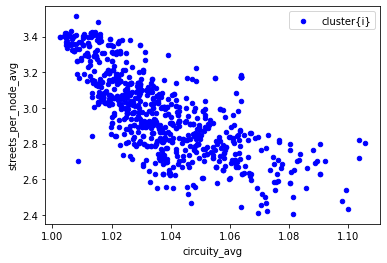

In [119]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue']
for i, station in stations_with_cluster.groupby('cluster_number'):
#    station.plot.scatter(x='k_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [120]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=12)

for _, station in stations_with_cluster.iterrows():
    color = 'red' if station['cluster_number'] == 0 else 'pink' if station['cluster_number'] == 1 else 'blue'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

0    750
1    301
2    596
3    384
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

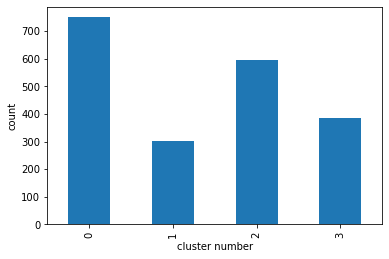

In [124]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=4, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [125]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,Unnamed: 0,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1361,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,0
1,1362,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,0
2,1363,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,0
3,1364,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,2
4,1365,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,2


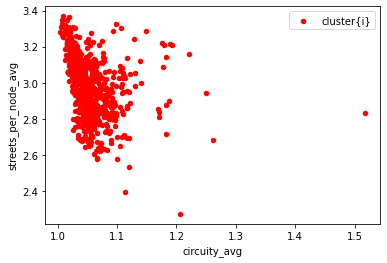

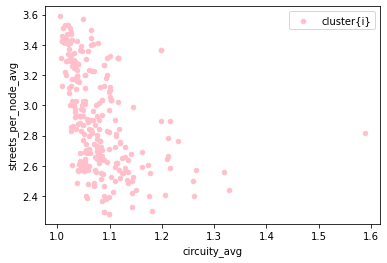

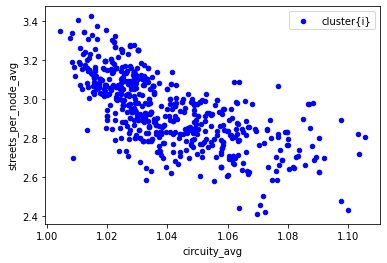

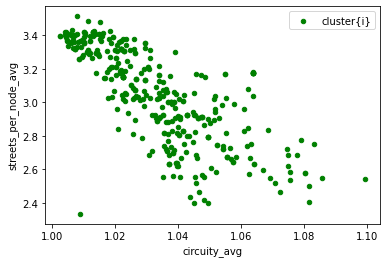

In [126]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
stations_3 = stations_with_cluster[stations_with_cluster['cluster_number'] == 3]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue', 'green']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [127]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=12)

for _, station in stations_with_cluster.iterrows():
    color = 'red' if station['cluster_number'] == 0 else 'pink' if station['cluster_number'] == 1 else 'blue' if station['cluster_number'] == 2 else 'green'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

0    750
1    301
2    596
3    384
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

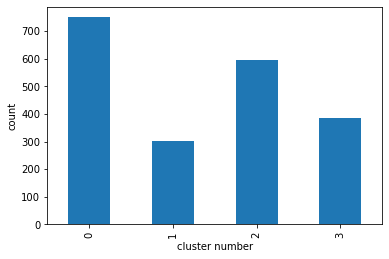

In [128]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=4, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [129]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,Unnamed: 0,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1361,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,0
1,1362,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,0
2,1363,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,0
3,1364,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,2
4,1365,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,2


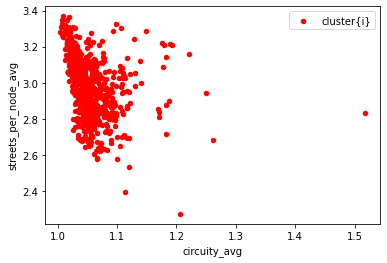

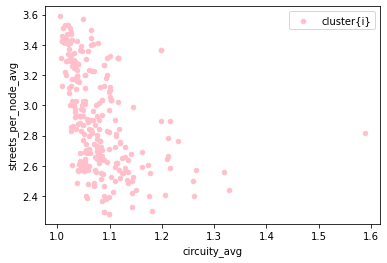

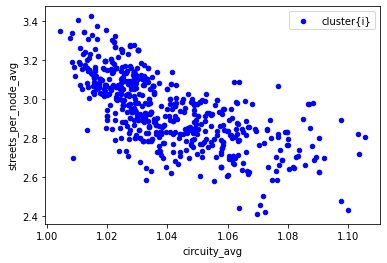

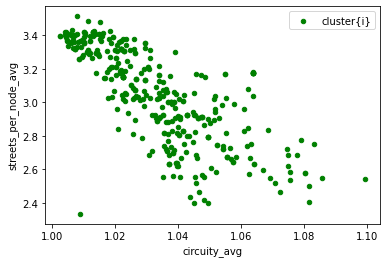

In [130]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
stations_3 = stations_with_cluster[stations_with_cluster['cluster_number'] == 3]
stations_4 = stations_with_cluster[stations_with_cluster['cluster_number'] == 4]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue', 'green', 'yelllow']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [131]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=12)

for _, station in stations_with_cluster.iterrows():
    color = 'yellow' if station['cluster_number'] == 0 else 'pink' if station['cluster_number'] == 1 else 'blue' if station['cluster_number'] == 2 else 'red' if station['cluster_number'] == 3 else 'green'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

<ipython-input-131-65432777307d>:8: UserWarning: color argument of Icon should be one of: {'cadetblue', 'orange', 'darkblue', 'darkred', 'red', 'gray', 'pink', 'lightred', 'green', 'white', 'darkgreen', 'lightgreen', 'blue', 'darkpurple', 'lightgray', 'black', 'beige', 'purple', 'lightblue'}.
  folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)
